In [4]:
%pylab inline
import pandas as pd

Populating the interactive namespace from numpy and matplotlib


In [72]:
%load_ext autoreload
%autoreload 2
from ADE20K_analysis_toolbox import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Counting approved BBs task remaining

In [199]:
import ast
bb_info = pd.read_csv("bounding_box.csv")
bb_info["num_clicks"]=bb_info["x_locs"].apply(lambda x: len(ast.literal_eval(x[1:-1])))
approved_bb = bb_info[bb_info["num_clicks"]>=3]
approved_bb.to_csv("approved_bounding_box.csv")
approved_BB_count = approved_bb.groupby("object_id",as_index=False).count()[["object_id","worker_id"]].rename(columns={"worker_id":"approved_BB_count"})
BBcount = bb_info.groupby("object_id",as_index=False).count()[["object_id","worker_id"]].rename(columns={"worker_id":"BB_count"})
final_BB_count = approved_BB_count.merge(BBcount)
final_BB_count = final_BB_count.rename(columns={"object_id":"id"})
final_BB_count.to_csv("BB_count_tbl.csv")

In [197]:
# final_BB_count[final_BB_count["approved_BB_count"]<40]

In [198]:
print 'remaining tasks:',sum(40-final_BB_count["approved_BB_count"])
print 'remaining cost:',sum(40-final_BB_count["approved_BB_count"])*0.06

remaining tasks: -3
remaining cost: -0.18


In [111]:
# for i in df.object_id.unique():
#     visualize_bb_objects(i,obj_pointer=True)

# Visualize Resulting BBs

issue: 1
issue: 18


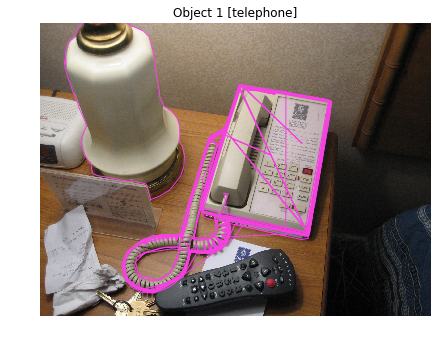

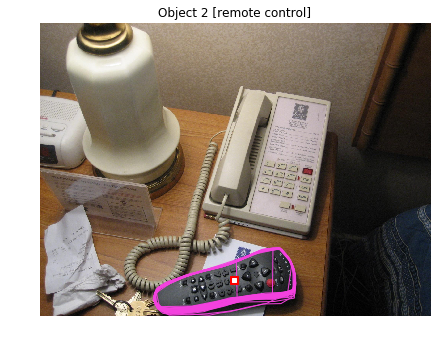

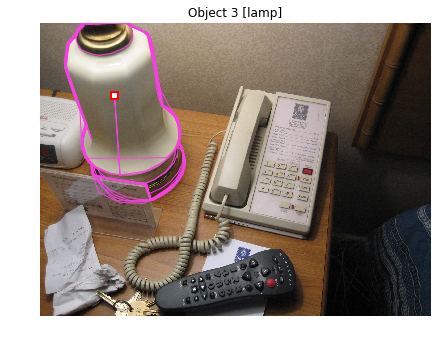

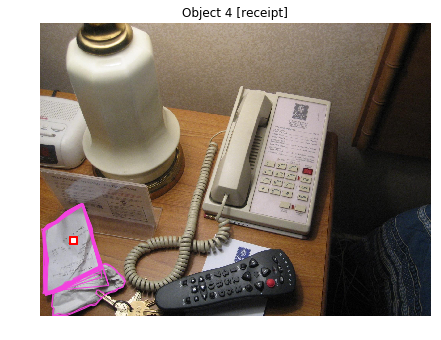

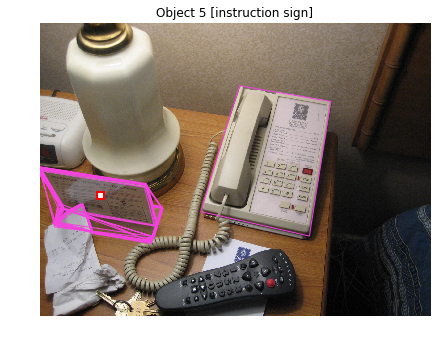

...

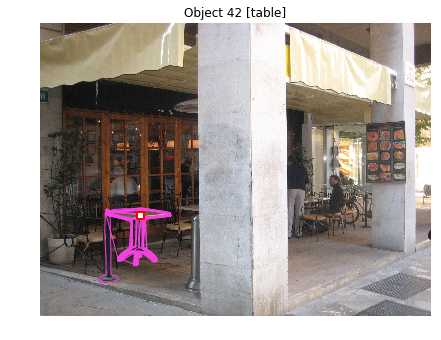

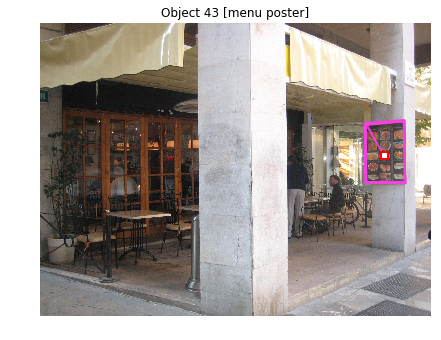

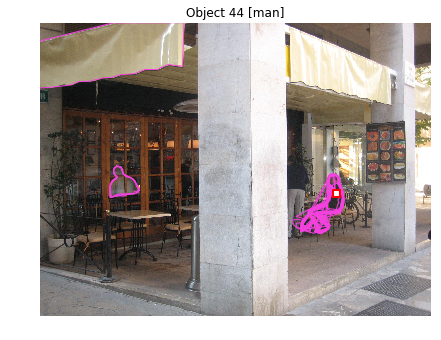

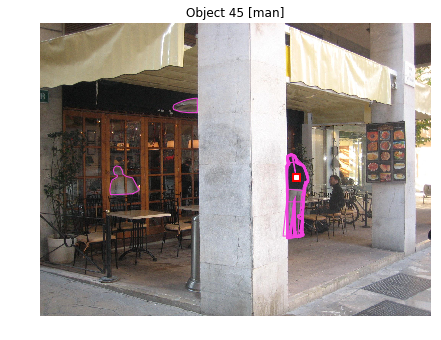

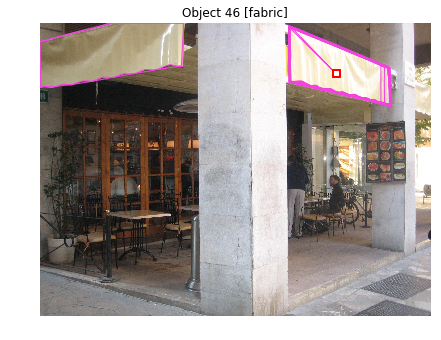

In [205]:
df = pd.read_csv("approved_bounding_box.csv")
for i in df.object_id.unique():
    try:
        visualize_bb_objects(i,obj_pointer=True)
    except(TypeError):
        print "issue:",i

In [207]:
import shapely

In [206]:
from shapely.validation import explain_validity
bb_info = pd.read_csv("bounding_box.csv")
# bb_info=bb_info[bb_info["worker_id"]>3]#do not include BB<=3 since they are drawn for testing and wid=3 is ground truth
for bb in bb_info.iterrows():
    bb=bb[1]
    xloc,yloc =  process_raw_locs([bb["x_locs"],bb["y_locs"]]) 
    worker_BB_polygon=Polygon(zip(xloc,yloc))
    if explain_validity(worker_BB_polygon).split("[")[0]=='Self-intersection':
        bb_info.drop(bb.name, inplace=True)

OSError: Could not find lib geos_c or load any of its variants ['/Library/Frameworks/GEOS.framework/Versions/Current/GEOS', '/opt/local/lib/libgeos_c.dylib'].